In [1]:
import librosa
import librosa.display
import IPython.display
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.style as ms

ms.use('seaborn-muted')
%matplotlib inline

In [2]:
file_path = "../data/songData/genres/blues/blues.00000.wav"
y, sr = librosa.load(file_path)
print(y.shape)
IPython.display.Audio(data=y, rate=sr)

(661794,)


In [3]:
# separete harmonic and percussive
y_h, y_p = librosa.effects.hpss(y)
IPython.display.Audio(data=y_h, rate=sr)

In [4]:
# Listen the percussive part
IPython.display.Audio(data=y_p, rate=sr)

In [5]:
# shifting pitch
y_shift = librosa.effects.pitch_shift(y, sr, 7)
IPython.display.Audio(data=y_shift, rate=sr)

In [6]:
# tempo change 
y_slow = librosa.effects.time_stretch(y, 0.5)
IPython.display.Audio(data=y_slow, rate=sr)

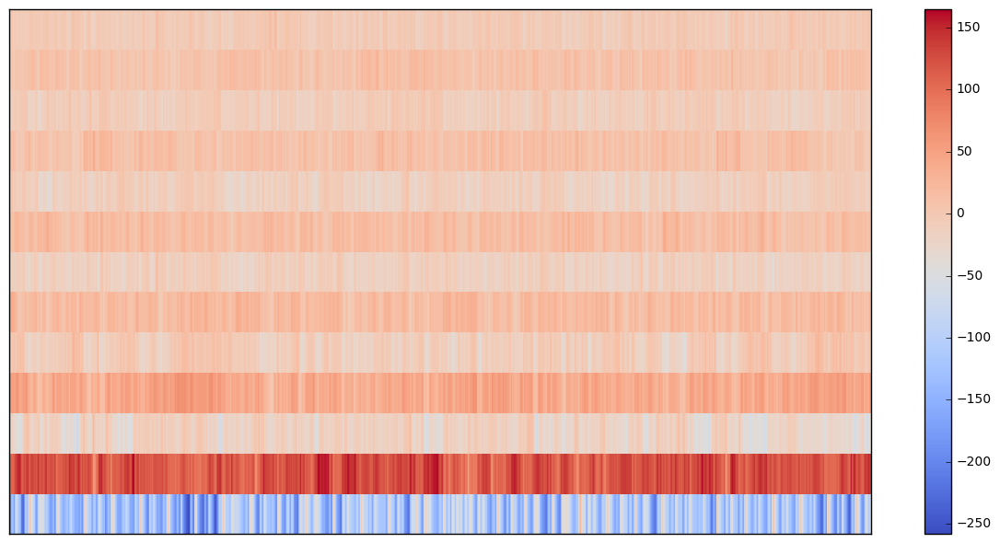

In [7]:
mfcc_effect = librosa.effects.feature.mfcc(y, sr=sr, n_mfcc=13)

plt.figure(figsize=(12, 6))
librosa.display.specshow(mfcc_effect)
plt.colorbar()
plt.tight_layout()

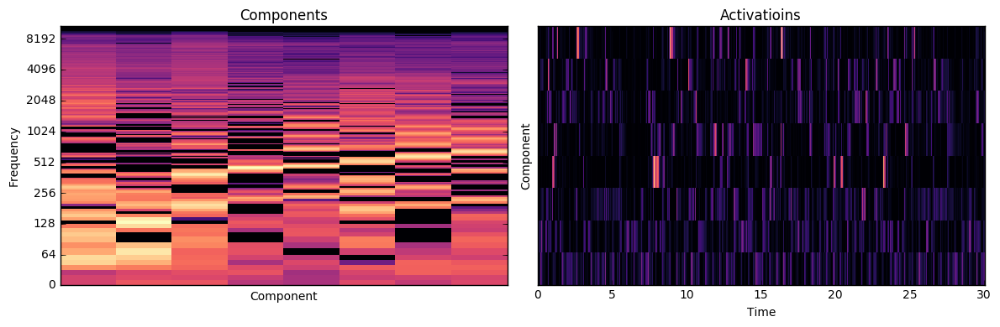

In [8]:
D = librosa.stft(y)
S, phase = librosa.magphase(D)
components, activations = librosa.decompose.decompose(S, n_components=8, sort=True)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
librosa.display.specshow(librosa.logamplitude(components**2.0, ref_power=np.max), y_axis='log')
plt.xlabel('Component')
plt.ylabel('Frequency')
plt.title('Components')

plt.subplot(1, 2, 2)
librosa.display.specshow(activations, x_axis='time')
plt.xlabel('Time')
plt.ylabel('Component')
plt.title('Activatioins')

plt.tight_layout()

In [4]:
librosa.decompose.decompose?

In [9]:
print(components.shape, activations.shape)

(1025, 8) (8, 1293)


In [10]:
D_k = components.dot(activations)
y_k = librosa.istft(D_k * phase)

print('Full reconstruction')
IPython.display.Audio(data=y_k, rate=sr)

Full reconstruction


In [11]:
k = 0
D_k = np.multiply.outer(components[:, k], activations[k])
y_k  = librosa.istft(D_k * phase)

print('Component #{}'.format(k))
IPython.display.Audio(data=y_k, rate=sr)

Component #0


In [12]:
k = len(activations) / 2
D_k = np.multiply.outer(components[:, k], activations[k])
y_k = librosa.istft(D_k * phase)

print('Component #{}'.format(k))
IPython.display.Audio(data=y_k, rate=sr)

/home/minato/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/ipykernel/__main__.py:2: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


Component #4.0
